In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import torch
import pytorch_lightning as pl
from helper import *
from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    accuracy_score,
    roc_auc_score,
    confusion_matrix,
    recall_score,
    precision_score,
)
from sklearn.model_selection import train_test_split
import joblib
from IPython.display import display as dp
import shap
import warnings
from matplotlib.patches import Circle

from lime import lime_image
from skimage.segmentation import mark_boundaries

import logging

logging.basicConfig(level=logging.ERROR)
logging.getLogger("lime").setLevel(logging.ERROR)


warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

sns.set_style("darkgrid")
torch.set_float32_matmul_precision("medium")

### 📖 Modeling Table of Contents

[__1. Load Data__](#1-load-data)

[__2. Modeling__](#2-modeling)
- [2.1 Preparation](#21-preparation)
- [2.2 Training](#22-training)

[__3. Prediction analysis__](#3-prediction-analysis)
- [3.1 Compare with baseline model](#31-compare-with-baseline-models)
- [3.2 Gender classification metrics](#32-gender-classification-metrics)
- [3.3 Age prediction residual plot](#33-age-prediction-residual-plot)

[__4. Error analysis__](#4-error-analysis)
- [4.1 Gender classification errors](#41-gender-classification-errors)
- [4.2 Age prediction errors](#42-age-prediction-errors)

[__5. Reflection and AI Ethics__](#5-reflection-on-ai-ethics)

[__6. Summary__](#6-summary)

### 1. Load Data

Note that positive class `1` for gender is female.


In [2]:
train_df = joblib.load("./data/train_test_data/train_df.pkl")
train_df = train_df[["file_name", "label_tensor"]]

val_df = joblib.load("./data/train_test_data/val_df.pkl")
val_df = val_df[["file_name", "label_tensor"]]

test_df = joblib.load("./data/train_test_data/test_df.pkl")
test_df = test_df[["file_name", "label_tensor"]]

dp(train_df.head())
print(f"Shape: {train_df.shape}")

,file_name,label_tensor
15543,./data/full_dataset/14_1_0_20170104005158239.j...,"[tensor(14.), tensor(1.)]"
4059,./data/full_dataset/29_1_1_20170105183913087.j...,"[tensor(29.), tensor(1.)]"
18019,./data/full_dataset/40_0_2_20170116180919548.j...,"[tensor(40.), tensor(0.)]"
6743,./data/full_dataset/62_0_0_20170111210035323.j...,"[tensor(62.), tensor(0.)]"
23167,./data/full_dataset/22_1_2_20170116162938834.j...,"[tensor(22.), tensor(1.)]"


Shape: (16678, 2)


### 2 Modeling

__Model Selection__
[SqueezeNet](https://pytorch.org/vision/main/models/generated/torchvision.models.squeezenet1_1.html#torchvision.models.squeezenet1_1) was chosen as the pretraining backbone for this project \
for its fast processing speed (GFLOPS: 0.35) and lightweight nature (4.7MB). \
(reference: Resnet18, GFLOPS: 1.8, size: 44MB)

Given that we are working with low-resolution (200x200) and low-variation \
(mainly faces) images, which place less demands on model intricacy, SqueezeNet \
offers a practical solution.

#### 2.1 Preparation

##### 2.1.1 Gender class weight

In [3]:
female_count = sum(train_df.label_tensor.apply(lambda i: (0, 1)[i[1] > 0]))
male_count = sum(train_df.label_tensor.apply(lambda i: (0, 1)[i[1] < 1]))
female_inverse_weight = torch.tensor((male_count / female_count), dtype=torch.float32)

female_inverse_weight

tensor(1.0955)

##### 2.1.2 Get initial learning rate suggestion

Seed set to 0


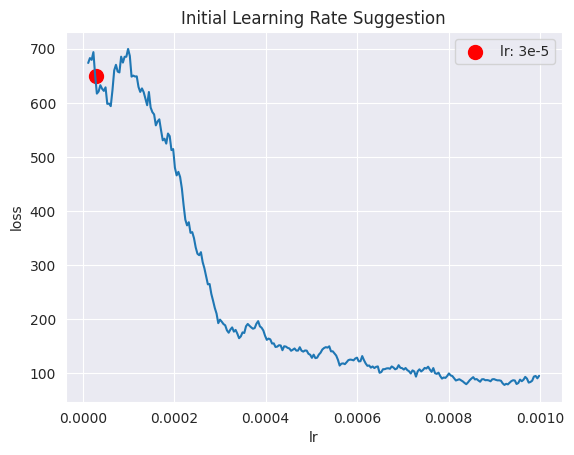

In [5]:
seed = 0
pl.seed_everything(seed)

# batch_size 32
loader = SqueezenetDataLoader(batch_size=32)
model = SqueezenetModel()

loss_lr_df = initial_lr_finder(model, loader, 32)

sns.lineplot(data = loss_lr_df, x = 'lr', y = 'loss')

dot_x = 0.00003
dot_y = 650
plt.scatter(dot_x, dot_y, color='red', s=100, label=f'lr: 3e-5')
plt.title('Initial Learning Rate Suggestion')
plt.legend()
plt.show()


#### 2.2 Training

##### 2.2.1 Head training

For head training, use the suggested lr: 2.5e-4, and train for 3 epochs. 

CyclicLR is used as lr-scheduler, the lr would oscillate between 2.5e-4 and 5e-5. 

Here we use batch size 32 for both head-training and fine-tuning, the batch \
size does not impact the result so much, only the training speed.

🛑 Special note: \
`Balance gender BCE loss and age MSE loss` for multitask prediction:

After several rounds of test run, I observed that BCELoss is always \
around 193x smaller than MSELoss across batches, thus the total loss is \
calculated as follows:

> total_loss = age_MSELoss + 193*gender_BCELoss

In [ ]:
suggested_lr = 0.00025

loader = SqueezenetDataLoader(batch_size=32)
model = SqueezenetModel(lr=suggested_lr)

train_head_pipeline(loader, model, "head_lr2.5e-4_b32", 3)

Total train duration: 37.85 seconds.


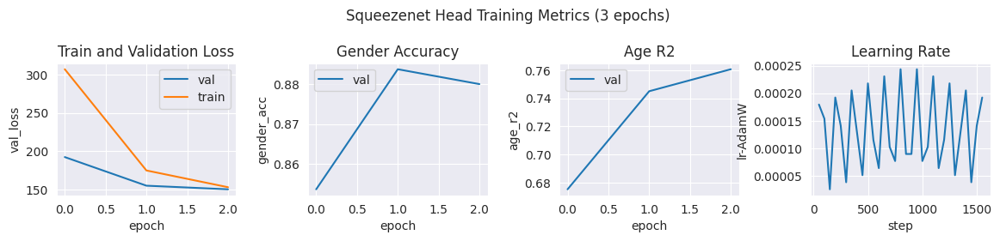

In [69]:
metrics_path = 'logs/mon/head_lr2.5e-4_b32/version_0/metrics.csv'
head_met = pd.read_csv(metrics_path)

print(f"Total train duration: {np.round(head_met.train_duration.tolist()[-1], 2)} seconds.")
fig_size(14,2)
plt.subplot(1,4,1)
sns.lineplot(data = head_met, x = 'epoch', y = 'val_loss', label='val')
sns.lineplot(data = head_met, x = 'epoch', y = 'train_loss_epoch', label='train')
plt.title('Train and Validation Loss')
plt.subplot(1,4,2)
sns.lineplot(data = head_met, x = 'epoch', y = 'gender_acc', label='val')
plt.title('Gender Accuracy')
plt.subplot(1,4,3)
sns.lineplot(data = head_met, x = 'epoch', y = 'age_r2', label='val')
plt.title('Age R2')
plt.subplot(1,4,4)
sns.lineplot(data = head_met, x = 'step', y = 'lr-AdamW')
plt.title('Learning Rate')
plt.suptitle('Squeezenet Head Training Metrics (3 epochs)', y = 1.2)
plt.subplots_adjust(wspace=0.4)
plt.show()

##### 2.2.2 Fine tuning

For fine tuning, learning rate is lowered to range  2.5e-4 ~ 8.75e-6, \
which is 10x ~ 30x smaller than for head training.

In [7]:
# load best head
best_head_path = (
    "logs/mon/head_lr2.5e-4_b32/version_0/checkpoints/epoch=02-val_loss=150.15.ckpt"
)

best_head_trained_model = SqueezenetModel.load_from_checkpoint(best_head_path)

# run fine tuning
fine_tune_pipeline(
    dataloader = loader, 
    head_trained_model = best_head_trained_model, 
    model_name = 'ft_lr2.5e-5_b32', 
    lr = suggested_lr * 0.1,
    epoch = 150
    )



Total train duration: 515.41 seconds.


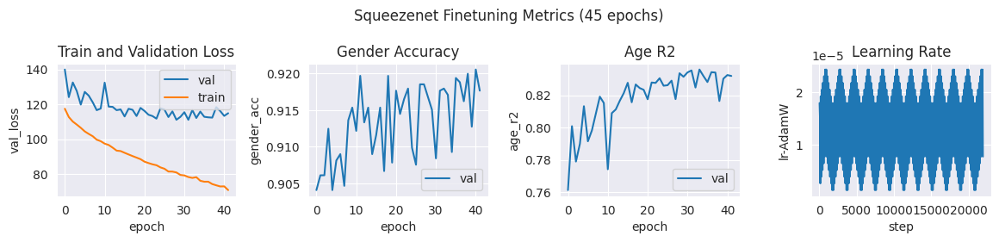

In [70]:
metrics_path = 'logs/mon/ft_lr2.5e-5_b32/version_0/metrics.csv'
ft_met = pd.read_csv(metrics_path)

print(f"Total train duration: {np.round(ft_met.train_duration.tolist()[-1], 2)} seconds.")
fig_size(14,2)
plt.subplot(1,4,1)
sns.lineplot(data = ft_met, x = 'epoch', y = 'val_loss', label='val')
sns.lineplot(data = ft_met, x = 'epoch', y = 'train_loss_epoch', label='train')
plt.title('Train and Validation Loss')
plt.subplot(1,4,2)
sns.lineplot(data = ft_met, x = 'epoch', y = 'gender_acc', label='val')
plt.title('Gender Accuracy')
plt.subplot(1,4,3)
sns.lineplot(data = ft_met, x = 'epoch', y = 'age_r2', label='val')
plt.title('Age R2')
plt.subplot(1,4,4)
sns.lineplot(data = ft_met, x = 'step', y = 'lr-AdamW')
plt.title('Learning Rate')
plt.suptitle('Squeezenet Finetuning Metrics (45 epochs)', y = 1.2)
plt.subplots_adjust(wspace=0.4)
plt.show()

During finetuning cycle, although training loss drop from 120 to below 80, validation loss does not \
improve after approx. 20 epochs, it plateued at around 115, and the training is early-stopped.

Similar pattern can be observed for gender accuracy and age-R2.

Looking back at the head training metrics, fine tuning slightly improve metric for both gender \
classification and age regression.

### 3 Prediction Analysis

In [363]:
best_finetune_path = (
    "logs/mon/ft_lr2.5e-5_b32/version_0/checkpoints/epoch=31-val_loss=111.09.ckpt"
)
best_finetune_model = SqueezenetModel.load_from_checkpoint(best_finetune_path)

loader = SqueezenetDataLoader(batch_size=32)

pred_res = prediction_pipeline(loader, best_finetune_model)

res_df = construct_pred_res_df(pred_res, test_df)


##### 3.1 Compare with baseline models
Compare with 2 baseline models:

- Dummy baseline: predict all gender to male (majority class), all age to mean of train age data.

- Head Trained baseline: Same model that `only the classifier head is trained`.

In [5]:
# construct a dummy model prediction result
dummy_res_df = res_df[['age_true', 'gender_true']].copy()
dummy_res_df['age_pred'] = np.mean([i[0].item() for i in train_df.label_tensor.tolist()])
dummy_res_df['gender_pred'] = 0

# predict with head-trained model
best_head_path = (
    "logs/mon/head_lr2.5e-4_b32/version_0/checkpoints/epoch=02-val_loss=150.15.ckpt"
)
best_head_trained_model = SqueezenetModel.load_from_checkpoint(best_head_path)
head_pred_res = prediction_pipeline(
    loader, best_finetune_model
)
head_baseline_res_df = construct_pred_res_df(head_pred_res, test_df)

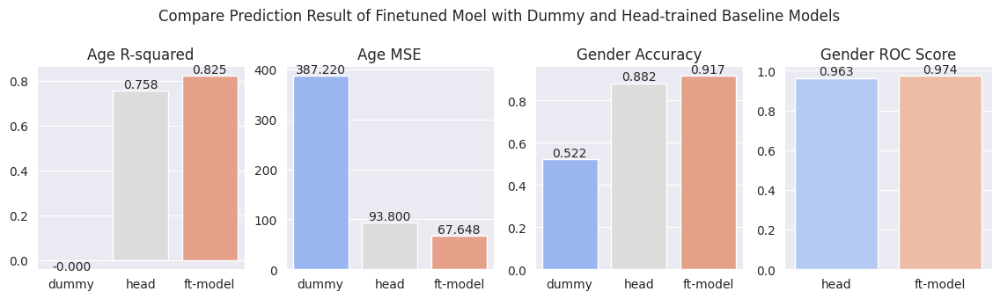

In [6]:
# age regression
mod_r2 = r2_score(res_df.age_true, res_df.age_pred)
mod_mse = mean_squared_error(res_df.age_true, res_df.age_pred)
dummy_r2 = r2_score(dummy_res_df.age_true, dummy_res_df.age_pred)
dummy_mse = mean_squared_error(dummy_res_df.age_true, dummy_res_df.age_pred)
head_baseline_r2 = r2_score(head_baseline_res_df.age_true, head_baseline_res_df.age_pred)
head_baseline_mse = mean_squared_error(head_baseline_res_df.age_true, head_baseline_res_df.age_pred)


# gender classification
mod_acc = accuracy_score(res_df.gender_true, res_df.gender_pred)
mod_roc = roc_auc_score(res_df.gender_true, res_df.gender_f_prob_pred)
head_baseline_roc = roc_auc_score(head_baseline_res_df.gender_true, head_baseline_res_df.gender_f_prob_pred)

dummy_acc = accuracy_score(dummy_res_df.gender_true, dummy_res_df.gender_pred)
head_baseline_acc = accuracy_score(head_baseline_res_df.gender_true, head_baseline_res_df.gender_pred)

fig_size(14,3)

plt.subplot(1,4,1)
ax1 = sns.barplot({ 'dummy': dummy_r2, 'head':head_baseline_r2, 'ft-model':mod_r2,}, palette='coolwarm')
mark_bar(ax1)
plt.title('Age R-squared')

plt.subplot(1,4,2)
ax2 = sns.barplot({ 'dummy': dummy_mse, 'head': head_baseline_mse, 'ft-model':mod_mse,}, palette='coolwarm')

mark_bar(ax2)
plt.title('Age MSE')


plt.subplot(1,4,3)
ax3 = sns.barplot({'dummy': dummy_acc,'head':head_baseline_acc, 'ft-model':mod_acc,}, palette='coolwarm')
mark_bar(ax3)
plt.title('Gender Accuracy')

plt.subplot(1,4,4)
ax4 = sns.barplot({'head':head_baseline_roc, 'ft-model':mod_roc,}, palette='coolwarm')
mark_bar(ax4)
plt.title('Gender ROC Score')


plt.suptitle('Compare Prediction Result of Finetuned Moel with Dummy and Head-trained Baseline Models', y=1.1)
plt.show()

Both head trained only and finetuned model have much better performance than dummy baseline. 

It is consistent with our observation during model training, finetuning also slightly improved the \
metrics for test set prediction.

##### 3.2 Gender classification metrics

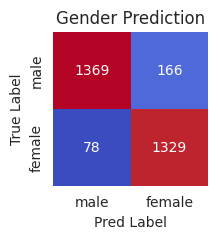

Gender recall:
	 male recall: 0.892
	 female recall: 0.945	
Gender precision:
	 male precision: 0.946
	 female precision: 0.889


In [141]:
# confusion matrix
cm = confusion_matrix(res_df.gender_true, res_df.gender_pred)
# getting age_true - age_pred
res_df['age_diff'] = (res_df.age_true - res_df.age_pred)/ res_df.age_true


fig_size(2,2)
sns.heatmap(cm, annot=True, fmt='d', cbar=False, cmap='coolwarm')
plt.ylabel('True Label')
plt.xticks([0.5,1.5], ['male', 'female'])
plt.yticks([0.5,1.5], ['male', 'female'])
plt.xlabel('Pred Label')
plt.title('Gender Prediction')
plt.show()

recall_total = np.round(recall_score(res_df.gender_true, res_df.gender_pred),3)
recall_male, recall_female = np.round(recall_score(res_df.gender_true, res_df.gender_pred, average=None),3)
precision_total = np.round(precision_score(res_df.gender_true, res_df.gender_pred),3)
precision_male, precision_female = np.round(precision_score(res_df.gender_true, res_df.gender_pred, average=None),3)

print(f"Gender recall:")
print(f"\t male recall: {recall_male}")
print(f"\t female recall: {recall_female}\t")

print(f"Gender precision:")
print(f"\t male precision: {precision_male}")
print(f"\t female precision: {precision_female}")

##### 3.3 Age prediction regression plot

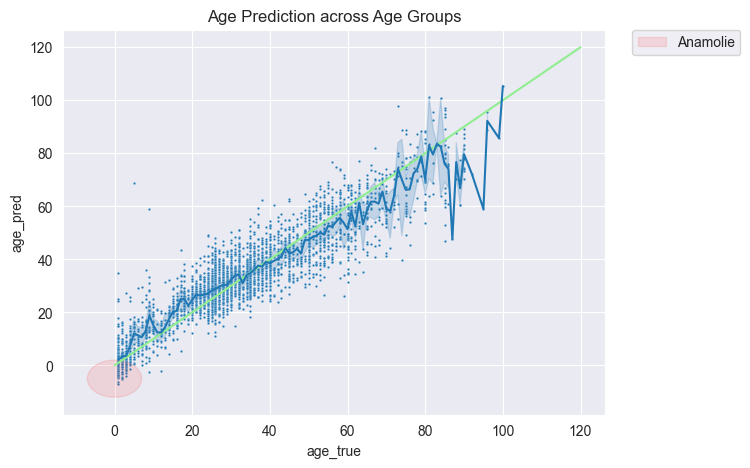

In [379]:
fig_size(7, 5)
# plt.subplot(1, 2, 1)

sns.lineplot(x=[0, 120], y=[0, 120], c="lightgreen")

ax1 = sns.scatterplot(
    data=res_df,
    x="age_true",
    y="age_pred",
    # hue="practical_age_group",
    s=3,
)

sns.lineplot(data=res_df, x="age_true", y="age_pred")


plt.title("Age Prediction across Age Groups")
plt.legend([])


circle1 = Circle((0, -5), 7, color="red", alpha=0.1, label="Anamolie")

ax1.add_patch(
    circle1,
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

From the age prediction residual plot, we can spot that the model is making the \
mistake of `predicting negative age` when true age is low as the age_diff (pred - true) \
is smaller than 0 when true age is 0 (where the red circle indicates).


In [374]:
print("Age prediction < 0-year-old:")
print(res_df.loc[res_df.age_pred < 0].shape[0], " images")

Age prediction < 0-year-old:
78  images


78 images are predicted as age < 0 !

> Move the < 0 year-old predictions to 0-year-old and re-evaluate.

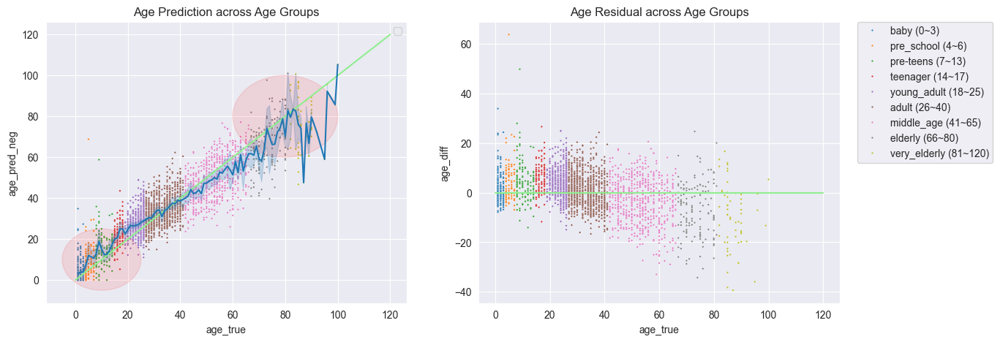

In [380]:
fig_size(14, 5)
plt.subplot(1, 2, 1)

sns.lineplot(x=[0, 120], y=[0, 120], c="lightgreen")

ax1 = sns.scatterplot(
    data=res_df,
    x="age_true",
    y="age_pred_neg",
    hue="practical_age_group",
    s=3,
)

sns.lineplot(data=res_df, x="age_true", y="age_pred_neg")


plt.title("Age Prediction across Age Groups")
plt.legend([])


circle1 = Circle((10, 10), 15, color="red", alpha=0.1, label="Circle")
circle2 = Circle((80, 80), 20, color="red", alpha=0.1, label="Circle")

ax1.add_patch(circle1)
ax1.add_patch(circle2)

plt.subplot(1, 2, 2)
sns.lineplot(x=[0, 120], y=[0, 0], c="lightgreen")

sns.scatterplot(
    data=res_df,
    x="age_true",
    y="age_diff",
    hue="practical_age_group",
    s=3,
)
plt.title("Age Residual across Age Groups")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

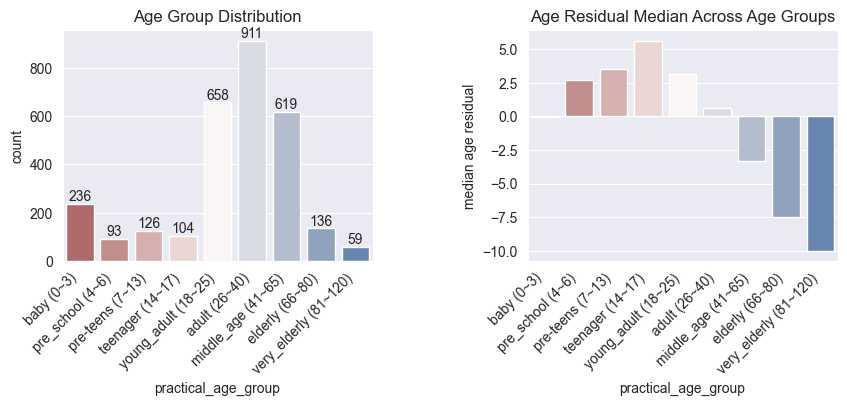

In [388]:
val_age_group_resd_df = (
    res_df.groupby("practical_age_group")["age_diff"].describe().round(2)
)

fig_size(10, 3)
plt.subplot(1, 2, 1)
ax = sns.barplot(val_age_group_resd_df["count"], palette="vlag_r")
mark_bar(ax, digit=0)
plt.xticks(rotation=45, ha="right")
plt.title("Age Group Distribution")

plt.subplot(1, 2, 2)
sns.barplot(val_age_group_resd_df["50%"], palette="vlag_r")
plt.xticks(rotation=45, ha="right")
plt.title("Age Residual Median Across Age Groups")
plt.ylabel("median age residual")
plt.subplots_adjust(wspace=0.5)
plt.show()

After the correction, the negative age predictions are eliminated. 

The median residuals for the overall age group fall within the range \
of -10 to +6.

The `over-estimation of age is the worst for teenagers`, 

> On average, the model predicts teenagers to be 5 years older than their actual age.

> This could impose danger if it is used as an age validation system for adults \
(say purchase of alcohol which many teenagers would try to do).

The model's age prediction residual is higher for elderly individuals (66~120), \
this is expected for several reasons:

- The primary age distribution in this dataset falls between 18 and 65, providing \
less data for the model to learn about elderly age groups.
- Higher true ages allow for greater variation in predictions, creating a larger \
potential margin of error.

Considering these two factors, the model’s age prediction remains robust across \
ifferent age groups, particularly within the age ranges where the majority of the \
population falls.

Some extreme outliers persists in the lower age group, such as a -60 residual \
around age 5 (in residual plot).Thist is likely due to poor or erroneous \
image quality rather than inaccurate model predictions. We will look into them \
further in the error analysis section.

Updated age prediction metrics after negative age correction:

In [390]:
res_df["age_diff_neg"] = res_df.age_pred_neg - res_df.age_true

corrected_r2 = np.round(r2_score(res_df.age_true, res_df.age_pred_neg), 3)
corrected_mse = np.round(mean_squared_error(res_df.age_true, res_df.age_pred_neg), 3)
print(f"Corrected R-squared: {corrected_r2}")
print(f"Corrected MSE: {corrected_mse}")

Corrected R-squared: 0.826
Corrected MSE: 67.303


Both R-Squared and MSE improved slightly after the correction:

- R-squared: 0.825 => 0.826
- MSE: 67.65 => 67.30


> Around 83% of the variation in age can be explained by the model.

### 4 Error Analysis

In [13]:
best_finetune_path = (
    "logs/mon/ft_lr2.5e-5_b32/version_0/checkpoints/epoch=31-val_loss=111.09.ckpt"
)
model = SqueezenetModel.load_from_checkpoint(best_finetune_path)
loader = SqueezenetDataLoader(batch_size=32)
loader.setup()

In [423]:
# prepare representative background images for shap analysis
bg_df = train_df.copy()
bg_df["age"] = bg_df.label_tensor.apply(lambda i: i[0].item())
bg_df["gender"] = bg_df.label_tensor.apply(lambda i: i[1].item()).astype("str")
bg_df["age_group"] = pd.cut(bg_df.age, [0, 5, 13, 25, 40, 60, 80, 120]).astype("str")
bg_df["age_gender_group"] = bg_df.age_group + "_" + bg_df.gender
# take a stratified sample as background
_, bg_samp_df = train_test_split(bg_df, stratify=bg_df.age_gender_group, test_size=0.01)
bg_samp_df = bg_samp_df[["file_name", "label_tensor"]]
bg_tensors = stack_to_tensor(bg_samp_df)

bg_tensors.shape

torch.Size([167, 3, 224, 224])

#### 4.1 Gender classification errors

In [546]:
tp_df = res_df.loc[res_df.gender_tp == True][["file_name", "label_tensor"]]
fp_df = res_df.loc[res_df.gender_fp == True][["file_name", "label_tensor"]]
tn_df = res_df.loc[res_df.gender_tn == True][["file_name", "label_tensor"]]
fn_df = res_df.loc[res_df.gender_fn == True][["file_name", "label_tensor"]]

tp_tensors = stack_to_tensor(tp_df)
fp_tensors = stack_to_tensor(fp_df)
tn_tensors = stack_to_tensor(tn_df)
fn_tensors = stack_to_tensor(fn_df)

##### 4.1.1 Visualize errors

Inspect the false positive and false negative images:

- False Positives: 
(Falsely predict male as female)

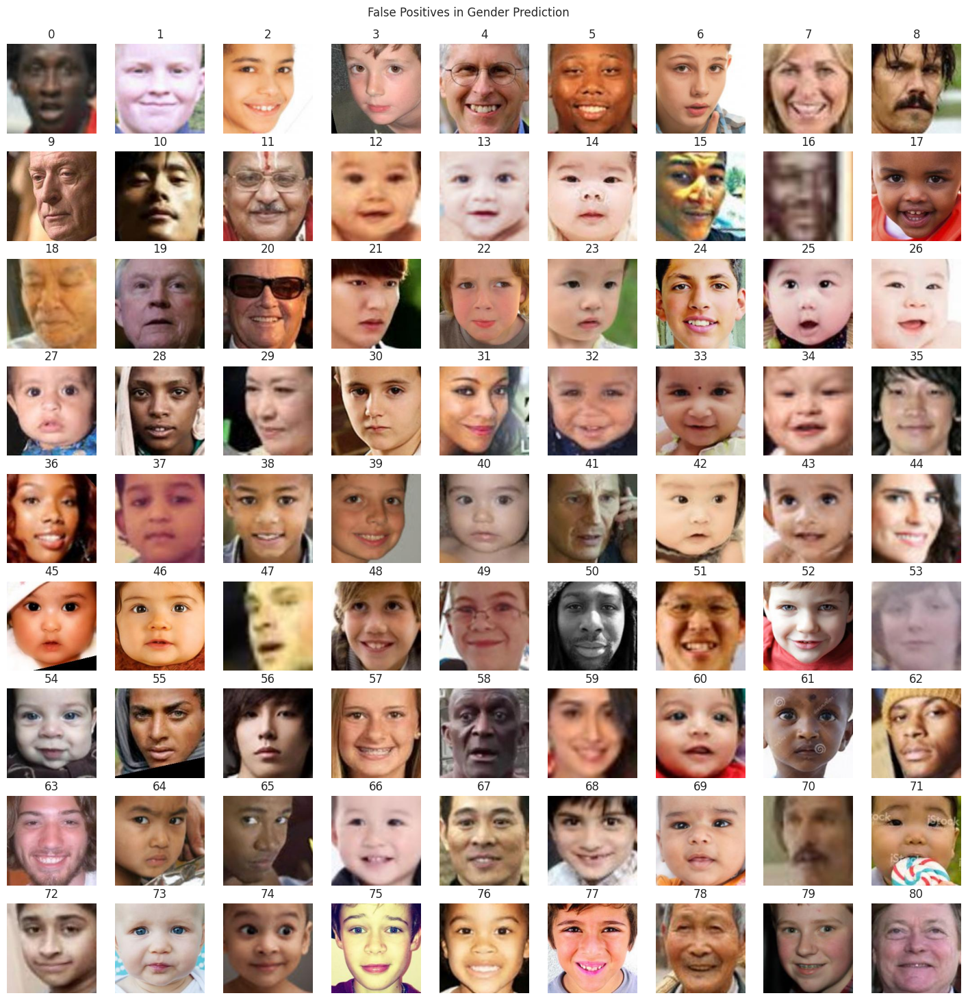

In [ ]:
plot_pred_res_images(fp_df, 'False Positives')


In [22]:
fp_below_3 = fp_df.loc[fp_df.label_tensor.apply(lambda i: i[0].item() < 3)].shape[0]
fp_below_13 = fp_df.loc[fp_df.label_tensor.apply(lambda i: i[0].item() < 13)].shape[0]


print(f'Number of baby/toddler with age < 3 in {fp_df.shape[0]} fp samples: {fp_below_3}' )
print(f'Number of img with age < 13 in {fp_df.shape[0]} fp samples: {fp_below_13}' )

Number of baby/toddler with age < 3 in 166 fp samples: 51
Number of img with age < 13 in 166 fp samples: 86


> Approximately 30% of false positive errors occurs from age < 3

> Over 50% of the false positive errors are for ages below the teenage years (13).

- False negatives: (falsely predict female as male)

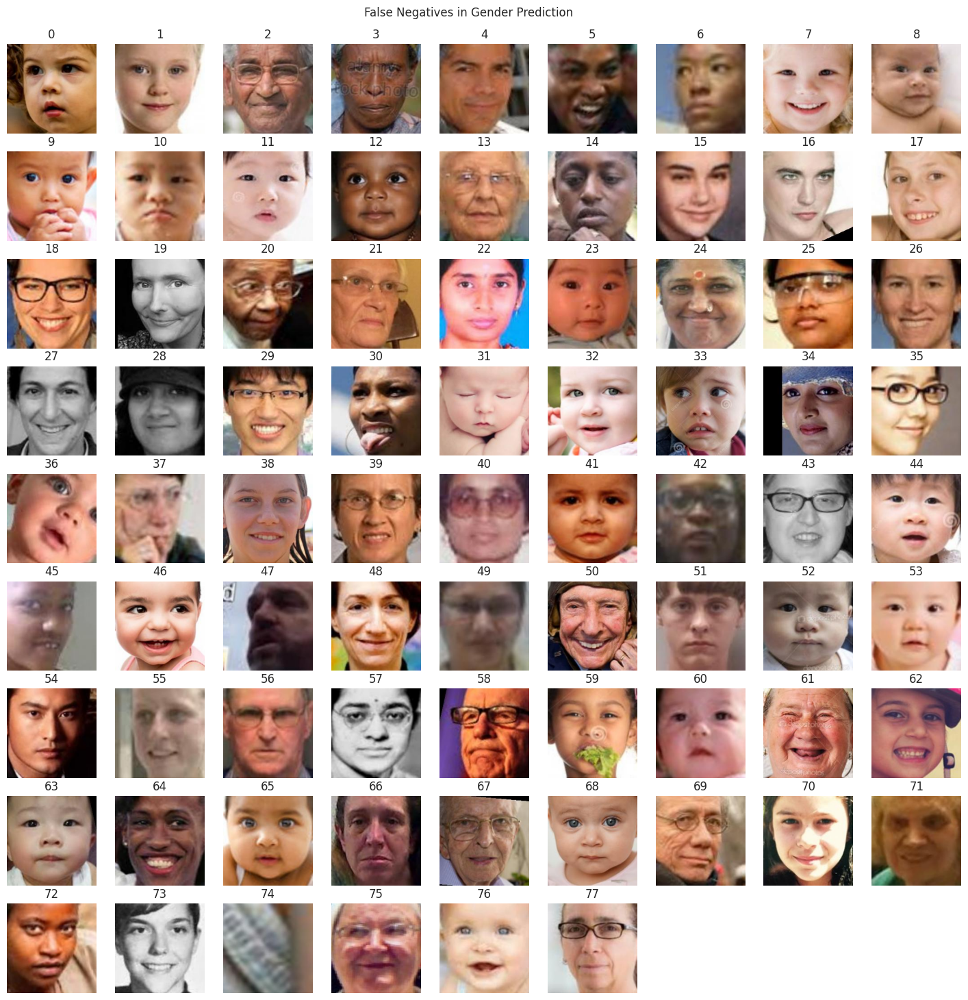

In [57]:
plot_pred_res_images(fn_df, 'False Negatives')

In [18]:
fn_below_3 = fn_df.loc[fn_df.label_tensor.apply(lambda i: i[0].item() < 3)].shape[0]
print(f'Number of baby/toddler with age < 3 in {fn_df.shape[0]} fn samples: {fn_below_3}' )

Number of baby/toddler with age < 3 in 78 fn samples: 19


> Approximately 25% of false negative errors occurs from cases where age is below 3.

> About 30% (21 ppl) of false negative errors are individuals wearing glasses. \
(in contrast to 3 ppl in false positives)

Some observations of FP and FN in gender classification:

False Positive samples:
- 30% are under 3-year-old,
- 50% are under teenage year (13-year-old),
- almost all males (>13) have clean shave (beardless),
- some images might be mislabeled as female (no. 7, 29, 31, 44, 59),

False Negative samples:
- 25% are under 3-year-old,
- 30% are wearing glasses,
- non-human dirty data,
- some images might be mislabeled as female or they might come from LGBTQ \
individuals (no. 5, 12, 14, 24, 31). I am quite certain about no.24 being mislabeled as he \
is a famous asian actor.


For both FP and FN, babies and toddlers are easily misclassified. \
I would argue that many of them are even very challenging for human to tell the genders. \
The facial structure of babies are quite different from different age group, and they \
also mostly don't have much hair and certainly no beard which are good indicators for gender.
> To improve gender classification for babies and toddlers, the model should be \
trained specifically on images of babies and toddlers.

> Babies images might even create bias features for the other age groups due to \
it's strong characteristic.

There might be more male wearing glasses in our train data, to mitigate this bias we can 
> pre-identify people with glasses, and pass it in the classifier layer as an additional \
feature

For further error analysis, we will select some and explain with shap.GradientExplainer.

##### 4.1.2 Lime image explainer for classification

In [547]:
# select some images to explain
selected_tp_sample_idx = [2, 16, 46, 72, 52]
selected_tp_tensors = tp_tensors[selected_tp_sample_idx]

selected_fp_sample_idx = [4, 11, 21, 63, 31]
selected_fp_tensors = fp_tensors[selected_fp_sample_idx]

selected_tn_sample_idx = [3, 30, 46, 58, 55]
selected_tn_tensors = tn_tensors[selected_tn_sample_idx]

selected_fn_sample_idx = [18, 35, 24, 56, 72]
selected_fn_tensors = fn_tensors[selected_fn_sample_idx]

In [ ]:
def batch_predict(model, selected_ts: np.ndarray) -> np.ndarray:
    """
    Prepare input tensor, perform model inference, and return class probabilities.

    Args:
        selected_ts (np.ndarray): Input image tensor of shape (N, 224, 224, 3) or (224, 224, 3).
    
    Returns:
        np.ndarray: Array of shape (N, 2) with probabilities for each class (negative and positive).
    """
    if selected_ts.ndim == 3:
        selected_ts = np.expand_dims(selected_ts, axis=0)

    assert selected_ts.ndim == 4, "Input shape should be (N, 224, 224, 3)"
    selected_ts = np.transpose(selected_ts, (0, 3, 1, 2))
    assert selected_ts.shape[1:] == (3, 224, 224), "After transpose shape mismatch"

    selected_ts = torch.from_numpy(selected_ts).float()
    assert selected_ts.dtype == torch.float32, "After torch.from_numpy dtype mismatch"

    with torch.no_grad():
    
        age_gender_logits = model.forward(selected_ts)

    gender_logits = age_gender_logits[:, 1]
    pos_probs = torch.sigmoid(gender_logits).cpu().detach().numpy()
    neg_probs = 1 - pos_probs

    return np.stack([neg_probs, pos_probs], axis=1)


def get_lime_explanation(tensor_ls: List[torch.Tensor]) -> List[lime_image.ImageExplanation]:
    """
    Generate LIME explanations for a list of image tensors.

    Args:
        tensor_ls (List[torch.Tensor]): List of image tensors of shape (3, 224, 224).
    
    Returns:
        List[lime_image.ImageExplanation]: List of LIME explanations for each image tensor.
    """
    explanation_ls = []
    for i in tensor_ls:
        input = i.numpy()
        input = np.transpose(input, (1, 2, 0))
        explainer = lime_image.LimeImageExplainer(verbose=False)
        explanation = explainer.explain_instance(
            input, batch_predict, hide_color=0, num_samples=1000
        )
        explanation_ls.append(explanation)

    return explanation_ls

In [ ]:
tp_explanation_ls = get_lime_explanation(tensor_ls=selected_tp_tensors)
fp_explanation_ls = get_lime_explanation(tensor_ls=selected_fp_tensors)
tn_explanation_ls = get_lime_explanation(tensor_ls=selected_tn_tensors)
fn_explanation_ls = get_lime_explanation(tensor_ls=selected_fn_tensors)

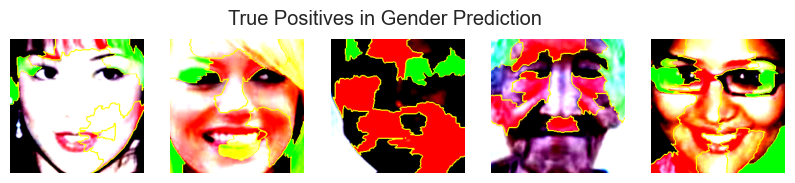

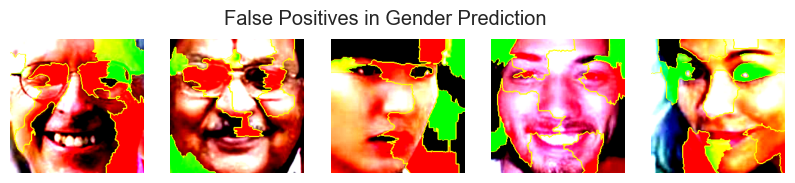

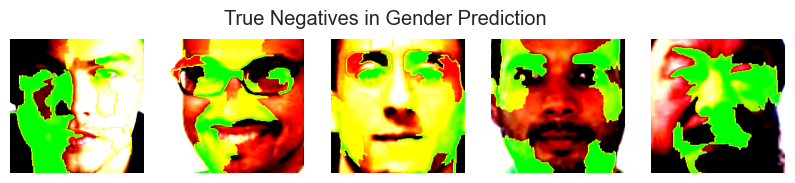

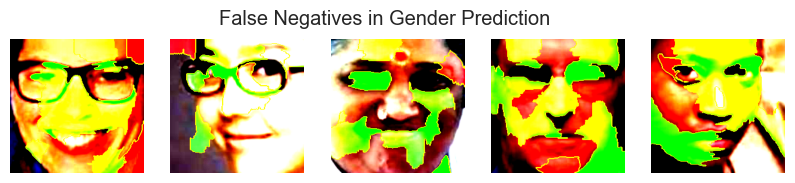

In [614]:
plot_lime_explanation(
    explanation_ls=tp_explanation_ls, group_name="True Positives", label=1
)
plot_lime_explanation(
    explanation_ls=fp_explanation_ls, group_name="False Positives", label=1
)
plot_lime_explanation(
    explanation_ls=tn_explanation_ls, group_name="True Negatives", label=0
)
plot_lime_explanation(
    explanation_ls=fn_explanation_ls, group_name="False Negatives", label=0
)

Some common features captured by model:

__female features__
- bang
- hair surround face
- non-disinct eyebrow
- red lips (cosmetic)

__male features__
- glasses
- distinct eyebrow
- deeper shadow around eye 
- beard and mustache

##### 4.1.3 Race impact on gender classification

- Race distribution in `false positive` images:

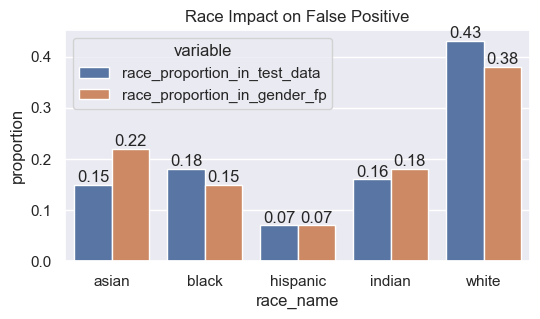

In [524]:
gender_fp_race = show_race_impact_in_pred_errors(res_df, "fp", 0)
gender_fp_race = gender_fp_race.melt(
    id_vars="race_name",
    value_vars=[
        "race_proportion_in_test_data",
        "race_proportion_in_gender_fp",
    ],
)

fig_size(6, 3)
ax = sns.barplot(data=gender_fp_race, x="race_name", y="value", hue="variable")
mark_bar(ax, 2)
plt.ylabel("proportion")
plt.title("Race Impact on False Positive")
plt.show()

The proportion of false positives for the Asian race (22%) is higher than its \
distribution in the total test data, while the opposite is true for the White race.

> This might be the reason that asian men tends to do clean shave more than other races.

White male is the most dominant race-gender group in this dataset, thus the model \
learn to identify them the best thus the smaller proportion in false positive.

- Race distribution in `false negative` images:

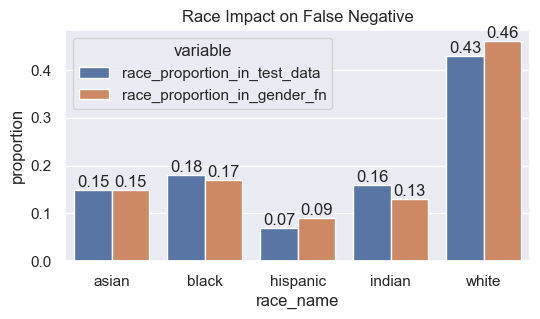

In [522]:
gender_fn_race = show_race_impact_in_pred_errors(res_df, "fn", 0)
gender_fn_race = gender_fn_race.melt(
    id_vars="race_name",
    value_vars=[
        "race_proportion_in_test_data",
        "race_proportion_in_gender_fn",
    ],
)

fig_size(6, 3)
ax = sns.barplot(data=gender_fn_race, x="race_name", y="value", hue="variable")
mark_bar(ax, 2)
plt.ylabel("proportion")
plt.title("Race Impact on False Negative")
plt.show()

The distribution of races in false negative is simililar to their respective \
distribution in the total population.

#### 4.2 Age prediction errors

##### 4.2.1 Visualize errors

Here we show the images with the largest age prediction errors: \
`age prediction residual > 20 or < -20`.

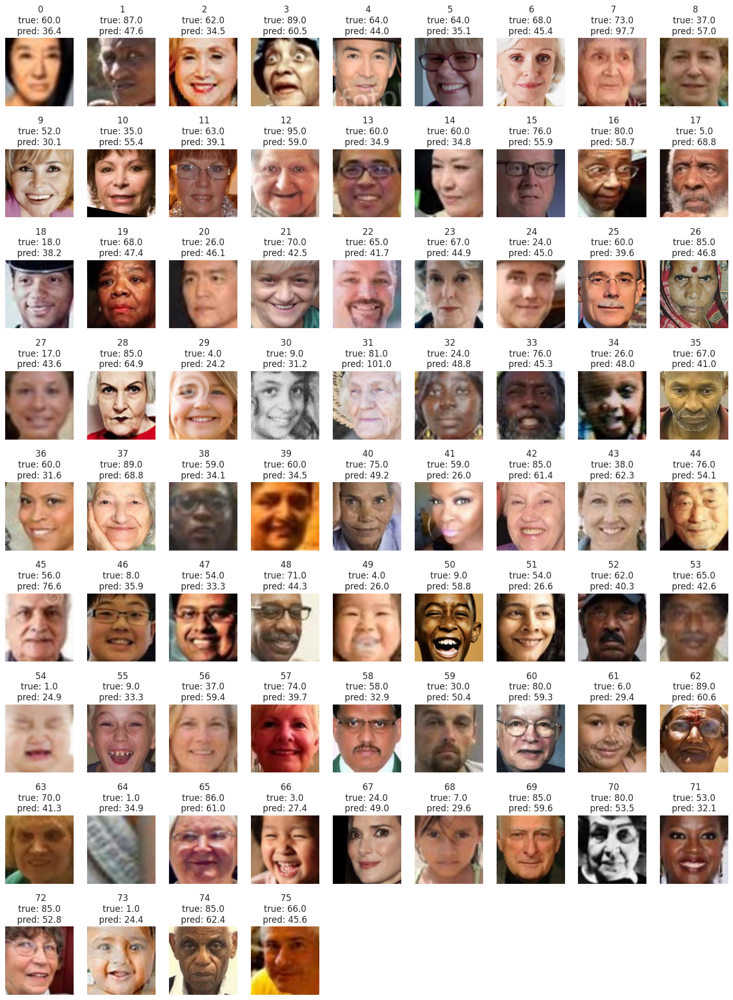

In [99]:
extreme_age_pred_resd_df = res_df.query('corrected_age_diff > 20 or corrected_age_diff < -20')
fig_size(18, 24)
age_true = extreme_age_pred_resd_df.age_true.apply(lambda i: round(i,1)).tolist()
age_pred = extreme_age_pred_resd_df.corrected_age_pred.apply(lambda i: round(i,1)).tolist()
for idx, i in enumerate(extreme_age_pred_resd_df.file_name):
    with Image.open(i) as img:
        plt.subplot(9, 9, idx+1)
        plt.imshow(img)
        plt.title(f"{idx}\ntrue: {age_true[idx]}\npred: {age_pred[idx]}")
        plt.axis('off')

plt.subplots_adjust(hspace=0.6)
plt.show()

Some observations:

- When children open their mouths widely in a vertical manner, the shape of their \
faces appears elongated, causing the model to significantly overestimate their age \
(e.g., cases 50, 55, and 66).

- With exaggerated facial expression, the age prediction is heavily impacted. \
(no. 3, 50, 54, 55, 66)

- Some elderly people look really young for their real age even for my human eye, \
cannot blame the model for under-estimating their age. (no. 0, 9, 13, 21, 41, 60, 72)

- Some images are clearly mislabeled (no. 17, )

##### 4.2.2 Shap gradient explainer for age regression

In [ ]:
def shap_explain(
    selected_tensors: torch.Tensor, target: str = "gender"
) -> tuple[np.ndarray, np.ndarray]:
    """
    Explain SHAP values for the selected tensors using a pre-trained model.

    Args:
        selected_tensors (torch.Tensor): Tensors representing the samples to explain.
        target (str): The target variable to explain ('gender' or other).

    Returns:
        tuple[np.ndarray, np.ndarray]: SHAP values and the test samples in the required format.
    """
    best_finetune_path = (
        "logs/mon/ft_lr2.5e-5_b32/version_0/checkpoints/epoch=31-val_loss=111.09.ckpt"
    )
    model = SqueezenetModel.load_from_checkpoint(best_finetune_path)

    shap_train = bg_tensors
    shap_test = selected_tensors  # samples to explain

    explainer = shap.GradientExplainer(model, shap_train)

    # compute SHAP values
    shap_explain_res = explainer.shap_values(shap_test)

    shap_test_np = np.transpose(shap_test.numpy(), (0, 2, 3, 1))

    if target == "gender":
        shap_explain_res = np.transpose(shap_explain_res[:, :, :, :, 1], (0, 2, 3, 1))

        return (shap_explain_res, shap_test_np)

    else:
        shap_explain_res = np.transpose(shap_explain_res[:, :, :, :, 0], (0, 2, 3, 1))
        return (shap_explain_res, shap_test_np)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6155462..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..2.4110641].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7731092..1.7865399].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


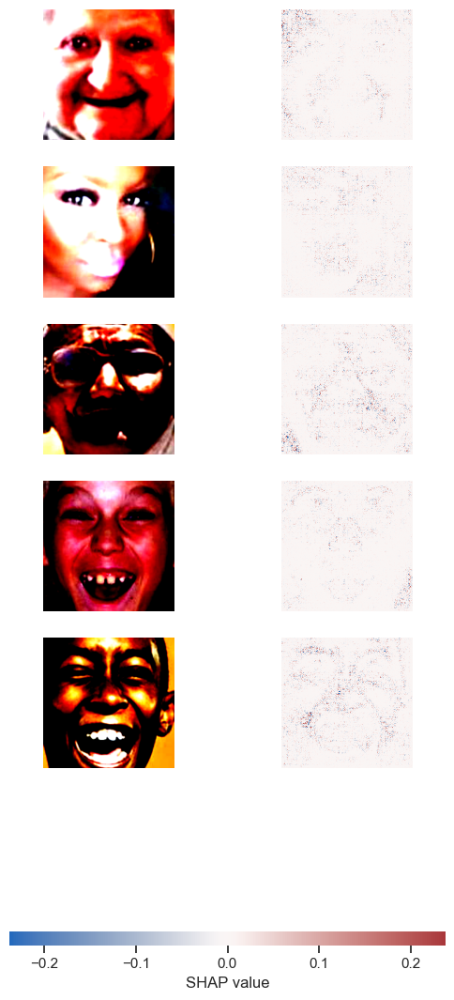

5 images with high residual
1. true: 95, pred: 59
2. true: 59, pred: 26
3. true: 89, pred: 60
4. true: 9, pred: 58.8
5. true: 9, pred: 33.3


In [540]:
select_ext_files = extreme_age_pred_resd_df.iloc[[12, 41, 62, 55, 50], [0, 1]]
ext_tensors = stack_to_tensor(select_ext_files)
shap_explain_ext, shap_test_ext = shap_explain(ext_tensors)

shap.image_plot(shap_explain_ext, shap_test_ext, cmap="vlag")
print("5 images with high residual")
print("1. true: 95, pred: 59")
print("2. true: 59, pred: 26")
print("3. true: 89, pred: 60")
print("4. true: 9, pred: 58.8")
print("5. true: 9, pred: 33.3")

- The first old lady's (95) close-up photo is framed tightly around her face, \
showing minimal hair. Her face appears round, and the image has a very high \
saturation level.

- The second lady (59) has feature of a young person, her brow and lips are captured, \
this might be the reason she's classified as a young person (26).

- The image of the third image is very dark, with glasses and smile captured. \
Glasses might be associated with a certain age group that's younger.

- The last two boys (9) are having exaggerated facial expression that creates \
creases on their faces, the creases are also shown on the shap plot, they might \
result in the prediction (58, 33).

##### 4.4.2 Race impact on age prediction

Compare occurrence of extreme age residuals (+/-20) across races:

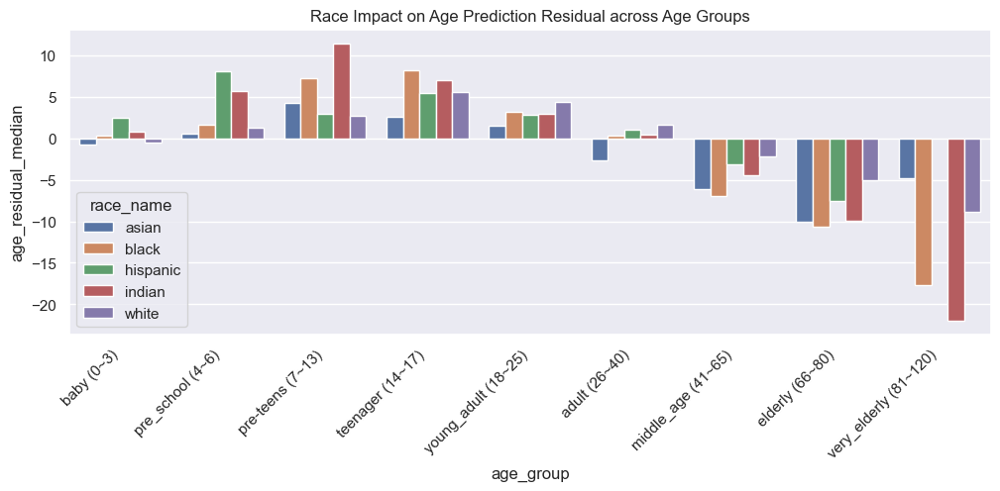

In [527]:
race_age_overview_df = (
    res_df.groupby(["race_name", "practical_age_group"], as_index=False)["age_diff_neg"]
    .describe()
    .iloc[:, [0, 1, 2, 7]]
)

race_age_overview_df["race_name"] = race_age_overview_df.race_name.astype("str")
race_age_overview_df["practical_age_group"] = (
    race_age_overview_df.practical_age_group.astype("str")
)

race_age_overview_df["race_age"] = (
    race_age_overview_df.race_name + "-" + race_age_overview_df.practical_age_group
)

fig_size(12, 4)
sns.barplot(
    data=race_age_overview_df, x="practical_age_group", y="50%", hue="race_name"
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("age_residual_median")
plt.xlabel("age_group")
plt.title("Race Impact on Age Prediction Residual across Age Groups")
plt.show()

Observations for race impact on age prediction:


- White and asian races are mostly the race with the smallest prediction error.

- Black and indian races have higher prediction error for older age groups.

- Hispanic race has higher prediction error for the youngest age groups.

- Age group adult and baby have the smallest error.

Age group adult (26~40) constitutes the largest segment of the dataset, making \
up approximately 30%, the abundance of images might help the model to learn \
this group better and resulting in smaller age prediction error. Conversely, \
smaller age groups, such as very elderly, pre-teens, and teenagers, have less \
representation, which may lead to larger prediction errors.

Images of babies are visually distinct from those of older age groups, making it \
easier for the model to identify them. Additionally, their age range is relatively \
narrow, which further simplifies the classification task.

The SqueezeNet transformation process darkens the images, which may affect \
prediction accuracy. In our EDA of different races, we noted that images of Asian \
and White individuals tend to be brighter, primarily due to their skin tones. \
This brightness difference could contribute to improved age prediction for these groups.

> Race has a big impact on age prediction accuracy. The the underlying reason \
might be the abundance/lack of data, image brightness, saturation, and distinctive \
features. 

> People of different races need different lighting to get optimal prediction \
result from the same model.

### 5. Reflection on AI Ethics

__Bias and fairness__
- the bias on predicting more asian males as females and individuals with glasses \
as males can impose wrong sense of sterotype and result in unfairness. 

- the underestimation of age can create unfairness in fields such as recruitment \
and health care or health insurance evalutation.

- the under and over-estimation of age on particular race group can contribute \
to racial bias.

__Accuracy and potential harm__
- the overestimation of age for youngsters can make it harmful when used as an age guard for some \
censored activities or contents. 

__Transparency__
- Even with AI explainer such as shap, we cannot fully understand some decision of the model such \
as the impact of different facial expression on age prediction.

__Others__
- Model which rely solely on images excludes LGBTQ individuals.


__Potential Applications of the Model__

(This model achieves 92% accuracy in gender prediction and an R² of 0.83 in age \
prediction, with homoscedastic age predictions across different age groups.)

- Personalized Marketing and Recommendations: Suitable for smart systems in stores \
or restaurants to suggest products based on a customer’s image.
- User Profile Verification: Useful for non-critical applications, like validating \
user demographics for joining a local sports club.
- Health and Wellness Services: Applicable to wellness platforms, where basic \
demographic insights can enhance personalization.

__Limitations and Inappropriate Uses__

- Medical/ clinical diagnostics.
- Legal/ law enforcement services 
- Validation for age-resticted content access.
- Recruitment. 
- Health care and insurance decisions. 



### 6 Summary

The model performs well in gender classification, achieving over 91% accuracy. \
However, it struggles with gender predictions for babies and toddlers. \
Additionally, it shows a bias towards predicting people wearing glasses as male, \
and Asian males have a higher chance of being misclassified as female possibly due \
to different grooming habits.

For age prediction, the model achieves an R2 score of 0.83, with homoscedastic \
residuals across age groups. Despite this, it tends to overestimate the age of \
people under 40. And race impacts the predictions in various age groups differently. \
It can also be misled by exaggerated facial expressions that alter the face's aspect \
ratio (height/width) or create creases/ wrinkles.

Model prediction can be improved by collecting more data for different age and race \
groups. Include more face images with glasses or use a simple model to identify and \
provide the glasses feature. Gender identification for babies are very challengling \
even for human eye, a model trained with baby-only images would be more practical.

##### Future Improvements:

- Add a ReLU/ Softplus as the last layer for continuous age prediction to ensure \
non-negative prediction.

- Pretrain a small model to identify baby/ glasses and feed this feature to the \
feature map prior to gender prediction.

- Experiment with image preprocessing (quantizing, PCA) to reduce noise and investigate \
it's impact on prediction.